In [2]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

# Step 1: Camera Calibration
Note: The calibration file includes 9x6 chessboard images, unlike the 8x6 images used in the lesson

Image Shape = (720, 1280, 3)


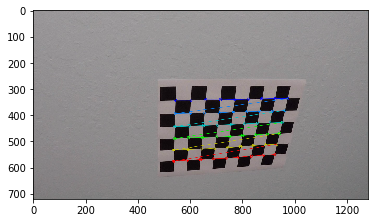

In [3]:
nx = 9
ny = 6
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    image_shape = img.shape
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        
        if (idx == 1): # print sample image
              plt.imshow(img)
              print("Image Shape = {}".format(img.shape))
#             cv2.imshow('img', img)
#             cv2.waitKey(500)

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, image_shape[:2], None, None)

# Step 2: Distortion Correction
test distortion correction with a sample image

Text(0.5,1,'Undistorted Image')

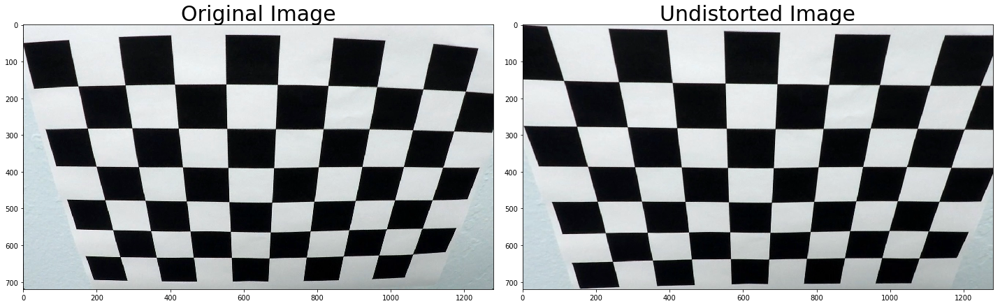

In [4]:
img_test = cv2.imread('camera_cal/calibration2.jpg')
img_size = (img.shape[1], img.shape[0])

undist_img_test = cv2.undistort(img_test, mtx, dist, None, mtx)
cv2.imwrite('camera_cal/undist_calibration2.jpg.jpg', undist_img_test)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.tight_layout()
ax1.imshow(img_test)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undist_img_test)
ax2.set_title('Undistorted Image', fontsize=30)


# Step 3: Color/Gradient Threshold

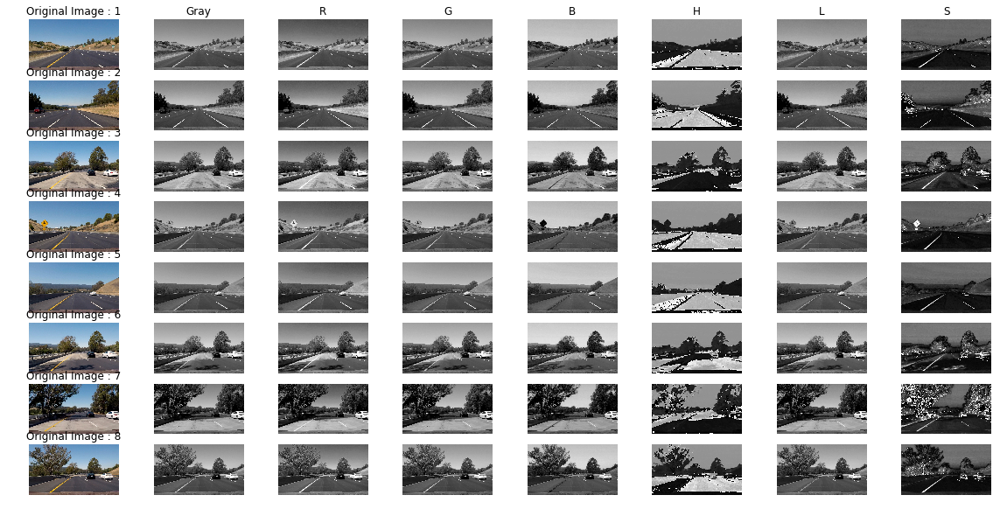

In [5]:
# 3.1: Explore Color Channels
images_test = glob.glob('test_images/*.jpg')
fig, axes = plt.subplots(8, 8, figsize=(20, 10)) # , figsize=(20, 10)
ind_plot = 1
for ii, fname in enumerate(images_test):

    img_raw = cv2.imread(fname)
    img     = cv2.cvtColor(img_raw, cv2.COLOR_BGR2RGB)
    R = img[:, :, 0]
    G = img[:, :, 1]
    B = img[:, :, 2]

    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H = hls[:, :, 0]
    L = hls[:, :, 1]
    S = hls[:, :, 2]

    if (ind_plot == 1): #(idx == 0):

        axes[ii, 0].imshow(img)
        axes[ii, 0].set_title('Original Image : {}'.format(ii+1)); axes[ii,0].set_axis_off();
        axes[ii, 1].imshow(gray, cmap='gray'); axes[ii, 1].set_axis_off();
        #
        axes[ii, 2].imshow(R, cmap='gray'); axes[ii, 2].set_axis_off();
        axes[ii, 3].imshow(G, cmap='gray'); axes[ii, 3].set_axis_off();
        axes[ii, 4].imshow(B, cmap='gray'); axes[ii, 4].set_axis_off();
        #
        axes[ii, 5].imshow(H, cmap='gray'); axes[ii, 5].set_axis_off();
        axes[ii, 6].imshow(L, cmap='gray'); axes[ii, 6].set_axis_off();
        axes[ii, 7].imshow(S, cmap='gray'); axes[ii, 7].set_axis_off();

        if ii == 0:
            axes[ii, 1].set_title('Gray');
            axes[ii, 2].set_title('R');
            axes[ii, 3].set_title('G');
            axes[ii, 4].set_title('B');
            axes[ii, 5].set_title('H');
            axes[ii, 6].set_title('L');
            axes[ii, 7].set_title('S');

plt.show()

In [6]:
# 3.2 Define Sobel Functions -------------------------------------------------------------
def abs_sobel_thresh(img_channel, orient='x', sobel_kernel=3, thresh=(0, 255)):

    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(img_channel, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img_channel, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

    if orient == 'x':
        sobel_out = sobelx
    elif orient == 'y':
        sobel_out = sobely

    abs_sobel = np.absolute(sobel_out)
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))

    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # binary_output = np.copy(img) # Remove this line
    binary_output = sxbinary

    return binary_output

# --------------------------------------------------------------------------------------
def mag_thresh(img_channel, sobel_kernel=3, mag_thresh=(0, 255)):

    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    sobelx = cv2.Sobel(img_channel, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img_channel, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

    # abs_sobelx = np.absolute(sobelx)
    gradmag = np.sqrt(sobelx ** 2 + sobely ** 2)

    # Rescale to 8 bit
    scale_factor = np.max(gradmag) / 255
    gradmag = (gradmag / scale_factor).astype(np.uint8)

    # binary_output = np.copy(img) # Remove this line
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    return binary_output

# ---------------------------------------------------------------------------------------
def dir_threshold(img_channel, sobel_kernel=3, thresh=(0, np.pi / 2)):

    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    sobelx = cv2.Sobel(img_channel, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img_channel, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)

    dir = np.arctan2(abs_sobely, abs_sobelx)

    binary_output = np.zeros_like(dir)
    binary_output[(dir >= thresh[0]) & (dir <= thresh[1])] = 1


    return binary_output
# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements

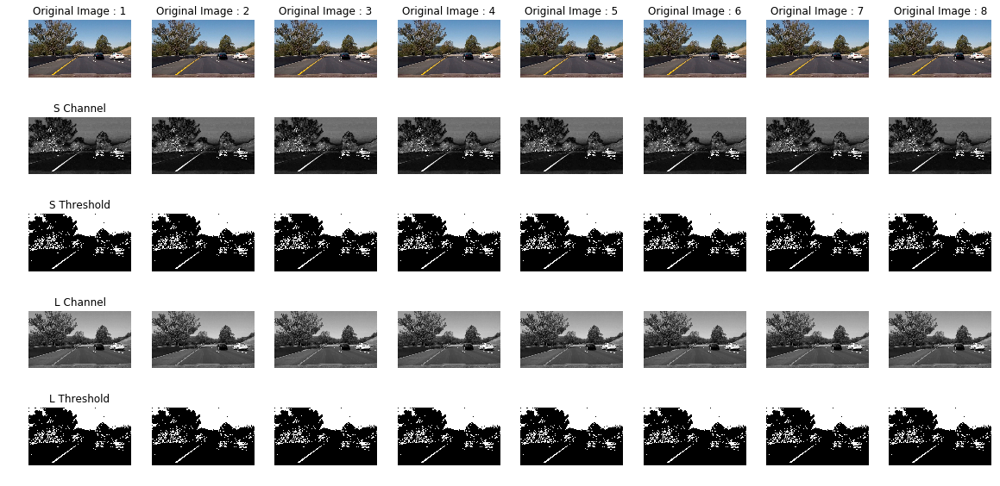

In [7]:
# 3.3: Explore Binary in S and L Channel
ind_plot = 1
if (ind_plot == 1):
    fig, axes = plt.subplots(5, 8, figsize=(20, 10)) # , figsize=(20, 10)
for ii, fname in enumerate(images_test):

    img_raw = cv2.imread(fname)

    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H = hls[:, :, 0]
    L = hls[:, :, 1]
    S = hls[:, :, 2]  # Use S Channel

    S_binary = np.zeros_like(S)
    S_Threshold = (100, 255)
    S_binary = (S >= S_Threshold[0]) & (S <= S_Threshold[1])

    L_binary = np.zeros_like(L)
    L_Threshold = (100, 255)
    L_binary = (L >= L_Threshold[0]) & (L <= L_Threshold[1])

    if (ind_plot == 1): #(idx == 0):

        axes[0, ii].imshow(img)
        axes[0, ii].set_title('Original Image : {}'.format(ii+1)); axes[0,ii].set_axis_off();

        axes[1, ii].imshow(S,        cmap='gray'); axes[1, ii].set_axis_off();
        axes[2, ii].imshow(S_binary, cmap='gray'); axes[2, ii].set_axis_off();

        axes[3, ii].imshow(L,        cmap='gray'); axes[3, ii].set_axis_off();
        axes[4, ii].imshow(S_binary, cmap='gray'); axes[4, ii].set_axis_off();

        if (ii == 0):
            axes[1, ii].set_title('S Channel')
            axes[2, ii].set_title('S Threshold')
            axes[3, ii].set_title('L Channel')
            axes[4, ii].set_title('L Threshold')
plt.show()

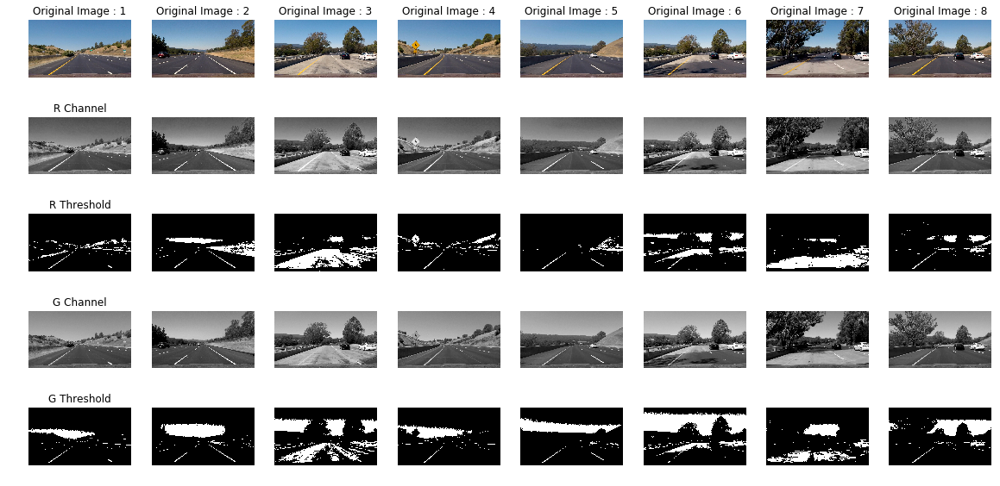

In [8]:
# 3.4: Explore Binary in R and G Channel
ind_plot = 1
if (ind_plot == 1):
    fig, axes = plt.subplots(5, 8, figsize=(20, 10)) # , figsize=(20, 10)
for ii, fname in enumerate(images_test):

    img_raw = cv2.imread(fname)
    img = cv2.cvtColor(img_raw, cv2.COLOR_BGR2RGB)
    R = img[:, :, 0]
    G = img[:, :, 1]
    B = img[:, :, 2]

    R_binary = np.zeros_like(R)
    R_Threshold = (170, 255)
    R_binary = (R >= R_Threshold[0]) & (R <= R_Threshold[1])

    G_binary = np.zeros_like(G)
    G_Threshold = (170, 255)
    G_binary = (G >= G_Threshold[0]) & (G <= G_Threshold[1])

    if (ind_plot == 1): #(idx == 0):

        axes[0, ii].imshow(img)
        axes[0, ii].set_title('Original Image : {}'.format(ii+1)); axes[0,ii].set_axis_off();

        axes[1, ii].imshow(R,        cmap='gray'); axes[1, ii].set_axis_off();
        axes[2, ii].imshow(R_binary, cmap='gray'); axes[2, ii].set_axis_off();

        axes[3, ii].imshow(G,        cmap='gray'); axes[3, ii].set_axis_off();
        axes[4, ii].imshow(G_binary, cmap='gray'); axes[4, ii].set_axis_off();

        if (ii == 0):
            axes[1, ii].set_title('R Channel')
            axes[2, ii].set_title('R Threshold')
            axes[3, ii].set_title('G Channel')
            axes[4, ii].set_title('G Threshold')
plt.show()

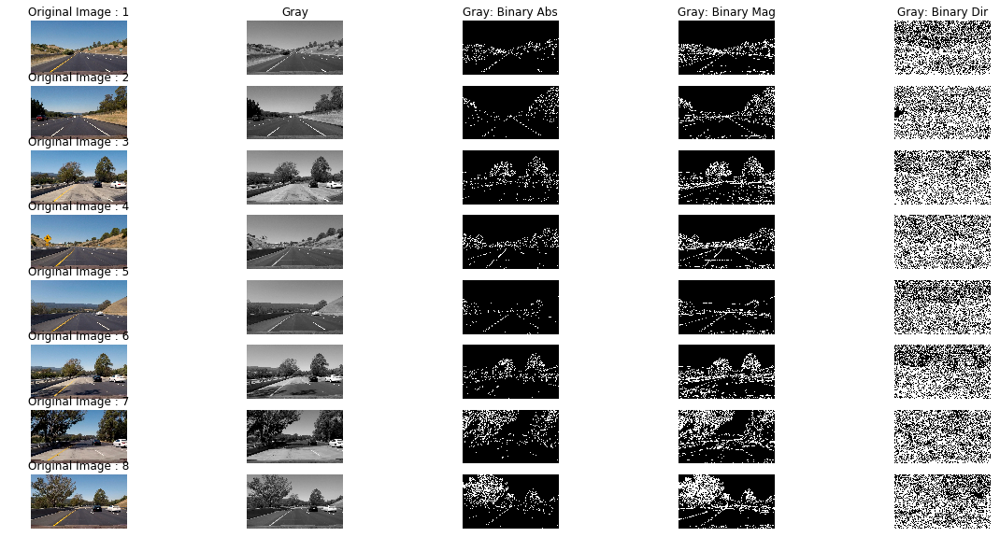

In [9]:
# 3.5: Explore Sobel Abs/Mag/Dir in Gray Channel
ind_plot = 1
if (ind_plot == 1):
    fig, axes = plt.subplots(8, 5, figsize=(20, 10)) # , figsize=(20, 10)
for ii, fname in enumerate(images_test):

    img_raw = cv2.imread(fname)
    img = cv2.cvtColor(img_raw, cv2.COLOR_BGR2RGB)

    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    Gray_binary_abs = abs_sobel_thresh(gray, orient='x', sobel_kernel=3, thresh=(20, 200))
    Gray_binary_mag = mag_thresh(gray, sobel_kernel=3, mag_thresh=(20, 200))
    Gray_binary_dir = dir_threshold(gray, sobel_kernel=3, thresh=(0.5, 1.5)) # 0.5-1.5

    if (ind_plot == 1): #(idx == 0):

        axes[ii, 0].imshow(img)
        axes[ii, 0].set_title('Original Image : {}'.format(ii+1)); axes[ii,0].set_axis_off();

        axes[ii, 1].imshow(gray, cmap='gray');            axes[ii, 1].set_axis_off();
        axes[ii, 2].imshow(Gray_binary_abs, cmap='gray'); axes[ii, 2].set_axis_off();
        axes[ii, 3].imshow(Gray_binary_mag, cmap='gray'); axes[ii, 3].set_axis_off();
        axes[ii, 4].imshow(Gray_binary_dir, cmap='gray'); axes[ii, 4].set_axis_off();

        if (ii == 0):
            axes[ii, 1].set_title('Gray')
            axes[ii, 2].set_title('Gray: Binary Abs')
            axes[ii, 3].set_title('Gray: Binary Mag')
            axes[ii, 4].set_title('Gray: Binary Dir')
plt.show()

In [10]:
# 3.6: Define Process Color and Gradient Function
def process_color_and_gradient(img_BGR, ksize=3):

    img = cv2.cvtColor(img_BGR, cv2.COLOR_BGR2RGB)

    # ------------------------------------------------------------------
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H = hls[:, :, 0]
    L = hls[:, :, 1]
    S = hls[:, :, 2]

    S_binary = np.zeros_like(S)
    S_Threshold = (100, 255)
    S_binary = (S >= S_Threshold[0]) & (S <= S_Threshold[1])

    L_binary = np.zeros_like(L)
    L_Threshold = (100, 255) # 220, 255
    L_binary = (L >= L_Threshold[0]) & (L <= L_Threshold[1])


    # ------------------------------------------------------------------
    R = img[:, :, 0]
    G = img[:, :, 1]
    B = img[:, :, 2]

    R_binary = np.zeros_like(R)
    R_Threshold = (150, 255)
    R_binary = (R >= R_Threshold[0]) & (R <= R_Threshold[1])

    G_binary = np.zeros_like(G)
    G_Threshold = (150, 255)
    G_binary = (G >= G_Threshold[0]) & (G <= G_Threshold[1])


    # ------------------------------------------------------------------
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    Gray_binary_abs = abs_sobel_thresh(gray, orient='x', sobel_kernel=3, thresh=(50, 150))  #20 200
    Gray_binary_mag = mag_thresh(gray, sobel_kernel=3, mag_thresh=(20, 200))
    Gray_binary_dir = dir_threshold(gray, sobel_kernel=3, thresh=(0.5, 1.5))  # 0.5-1.5


    # Combined ---------------------------------------------------------
    Combined_binary = np.zeros_like(R)
    Combined_binary[(S_binary & L_binary) | (Gray_binary_abs == 1)] = 1  # ***********************************
    #Combined_binary[(S_binary & L_binary) ] = 1

    return Combined_binary

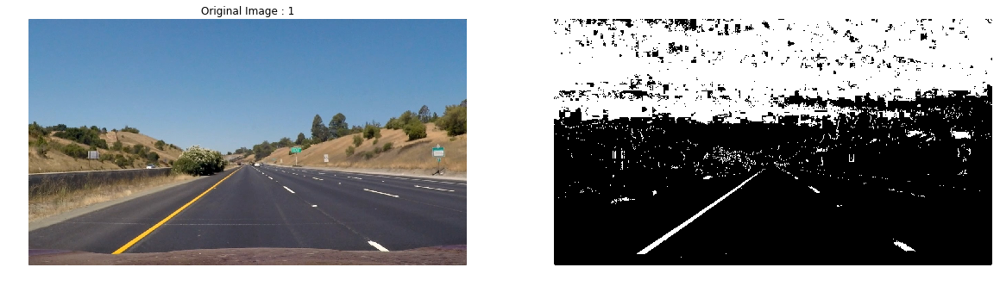

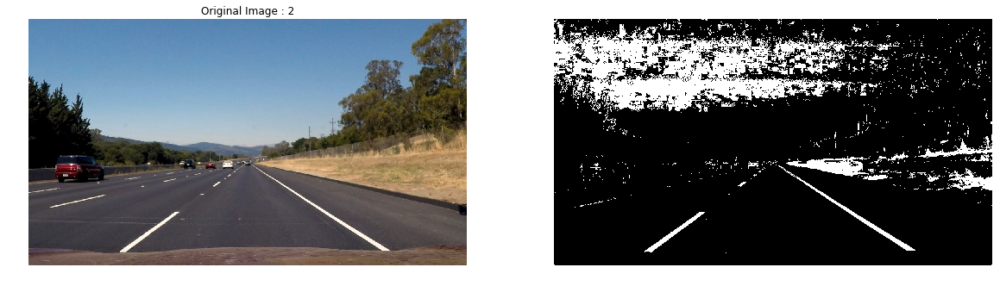

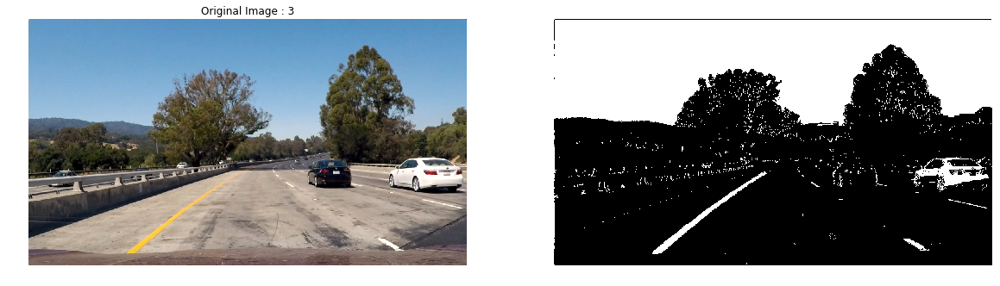

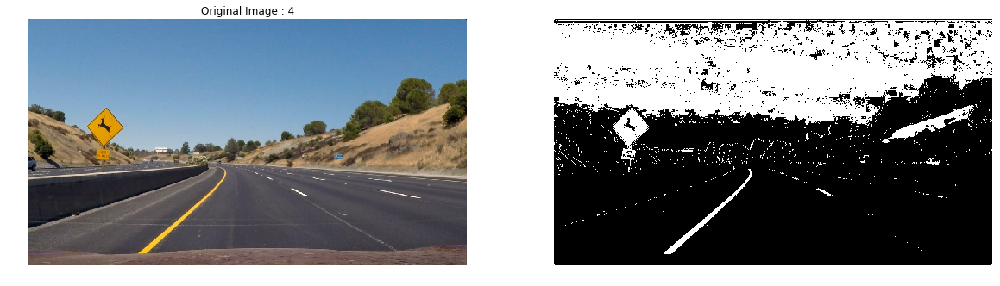

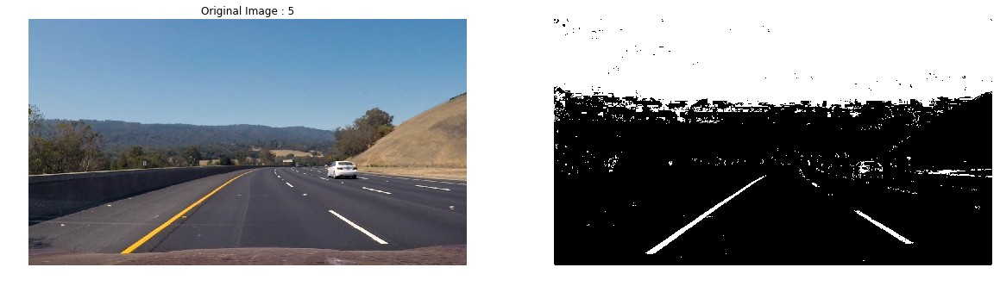

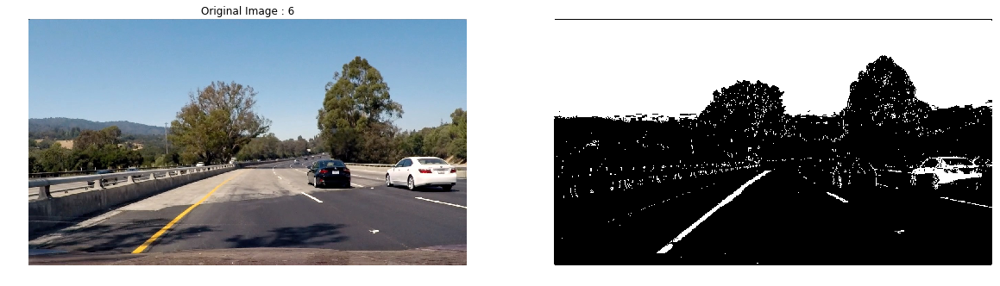

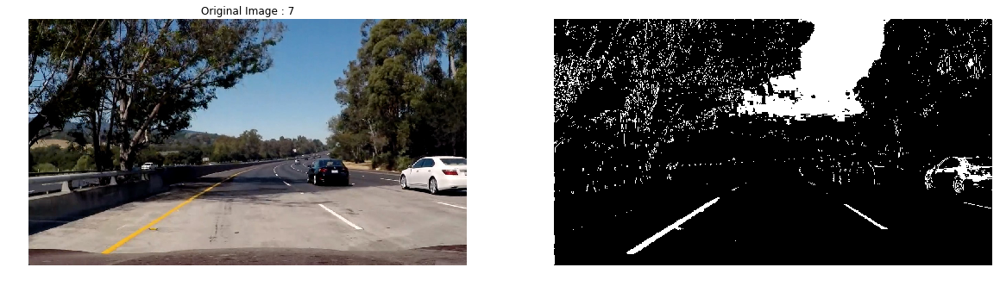

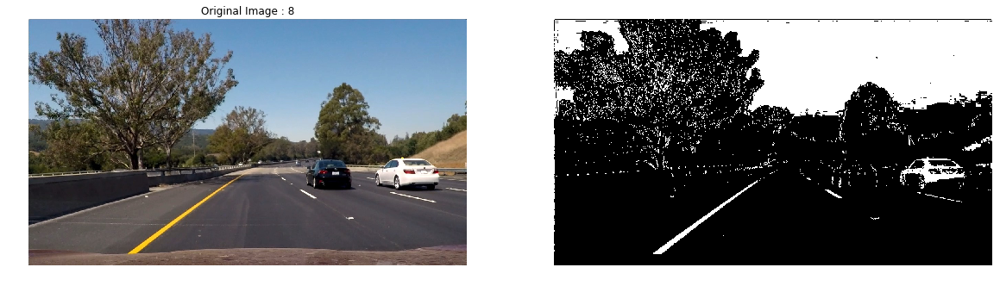

In [11]:
# 3.7: Test with test images
ind_plot = 1
#if (ind_plot == 1):
    #fig, axes = plt.subplots(4, 4, figsize=(20, 10)) # , figsize=(20, 10)
for ii, fname in enumerate(images_test):

    img_raw = cv2.imread(fname)
    img_BGR = img_raw
    img_RGB = cv2.cvtColor(img_BGR, cv2.COLOR_BGR2RGB)

    img_out = process_color_and_gradient(img_BGR, ksize=3)

    if (ind_plot == 1): #(idx == 0):
#         if ii <= 3:
#             axes[0, ii].imshow(img_RGB)
#             axes[0, ii].set_title('Original Image : {}'.format(ii+1)); axes[0,ii].set_axis_off();
#             axes[1, ii].imshow(img_out, cmap='gray'); axes[1, ii].set_axis_off();
#         else:
#             axes[2, ii-4].imshow(img_RGB)
#             axes[2, ii-4].set_title('Original Image : {}'.format(ii+1)); axes[2,ii-4].set_axis_off();
#             axes[3, ii-4].imshow(img_out, cmap='gray'); axes[3,ii-4].set_axis_off();
        fig, axes = plt.subplots(1, 2, figsize=(20, 10) ) # , figsize=(20, 10) 
        axes[0].imshow(img_RGB)
        axes[0].set_title('Original Image : {}'.format(ii+1)); axes[0].set_axis_off()
        axes[1].imshow(img_out, cmap='gray'); axes[1].set_axis_off()
plt.show()

# Step 4: Perspective Transformation

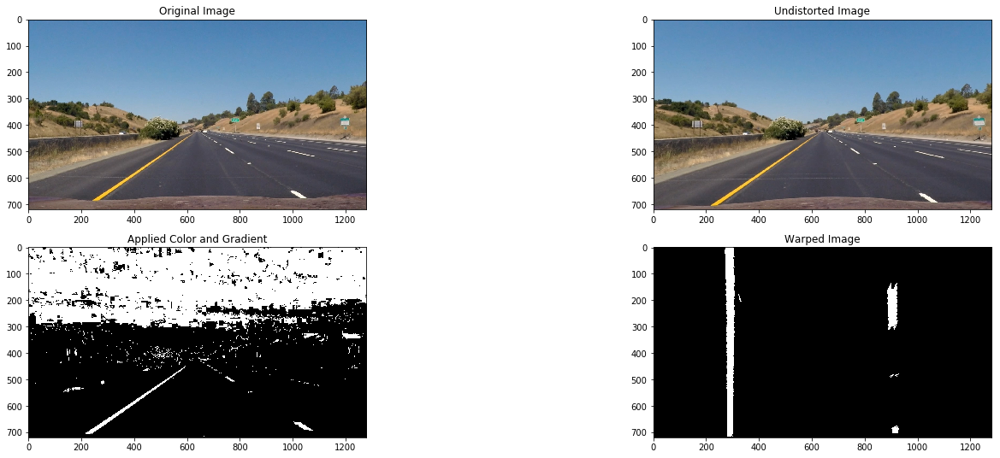

In [12]:
# del img
img_BGR = cv2.imread('test_images/straight_lines1.jpg')
img_RGB = cv2.cvtColor(img_BGR, cv2.COLOR_BGR2RGB)
img_BGR_undist = cv2.undistort(img_BGR, mtx, dist, None, mtx) # ***************
img_RGB_undist = cv2.undistort(img_RGB, mtx, dist, None, mtx)
img_col_grad = process_color_and_gradient(img_BGR_undist, ksize=3)
# plt.figure()
# plt.imshow(img_col_grad, cmap='gray')
# plt.show()

# plt.imshow(img)
# plt.show()
def warp(img):
    img_size = (img.shape[1], img.shape[0])

    # Four source coordinates
    src_bottom_left  = [233, 713]
    src_top_left     = [560, 478]
    src_top_right    = [729, 478]
    src_bottom_right = [1080, 718]
    src = np.float32( [src_bottom_left, src_top_left, src_top_right, src_bottom_right] )

    # Four desired coordinates
    dst_bottom_left  = [300, 720]
    dst_top_left     = [300, 1]
    dst_top_right    = [900, 1]
    dst_bottom_right = [900, 720]
    dst = np.float32([dst_bottom_left, dst_top_left, dst_top_right, dst_bottom_right])

    # Compute the perspective transform M
    M = cv2.getPerspectiveTransform(src, dst)

    # Could compute the inverse also by swapping the input paramters
    Minv = cv2.getPerspectiveTransform(dst, src)

    # Created warped images - uses linear interpolation
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)

    return warped, M, Minv

warped_img, M, Minv = warp(img_col_grad)

ind_plot = 1
if ind_plot == 1:
    f, axes = plt.subplots(2, 2, figsize=(24, 9))
    
    axes[0,0].imshow(img_RGB)
    axes[0,0].set_title('Original Image') #axes[0].set_axis_off();

    axes[0,1].imshow(img_RGB_undist)
    axes[0,1].set_title('Undistorted Image')  # axes[0].set_axis_off();

    axes[1,0].imshow(img_col_grad, cmap='gray')
    axes[1,0].set_title('Applied Color and Gradient')

    axes[1,1].imshow(warped_img, cmap='gray')
    axes[1,1].set_title('Warped Image')

    plt.show()

# Step 5: Find Lane Lines

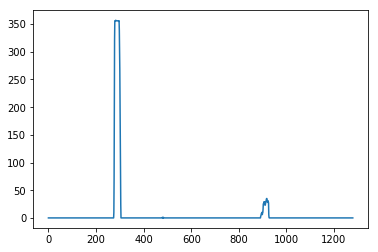

In [13]:
# 5.1: Histogram
warped_img;
histogram = np.sum(warped_img[warped_img.shape[0]//2:,:], axis=0)
plt.plot(histogram)
plt.show()

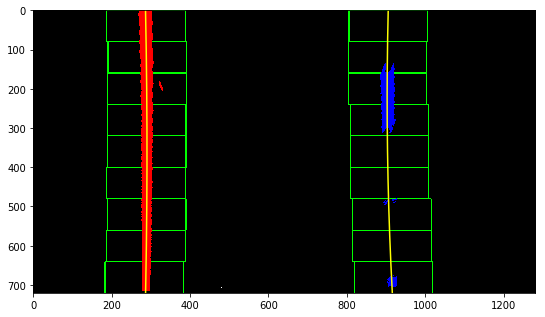

In [14]:
# 5.2: Implement Sliding Windows and Fit a Polynomial ---------------------------------------------------------------
binary_warped = warped_img;

# Take a histogram of the bottom half of the image
histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)

# Create an output image to draw on and  visualize the result
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint    = np.int(histogram.shape[0]/2)
leftx_base  = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint


# Choose the number of sliding windows
nwindows = 9 # ****************************************************************************************
# Set height of windows
window_height = np.int(binary_warped.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 100 # ****************************************************************************************
# Set minimum number of pixels found to recenter window
minpix = 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_height
    win_y_high = binary_warped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
    (0,255,0), 2)
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
    (0,255,0), 2)
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
    (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
    (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds]
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)


# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

ind_plot = 1
if (ind_plot):
    plt.figure(figsize=(9,24))
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.show()

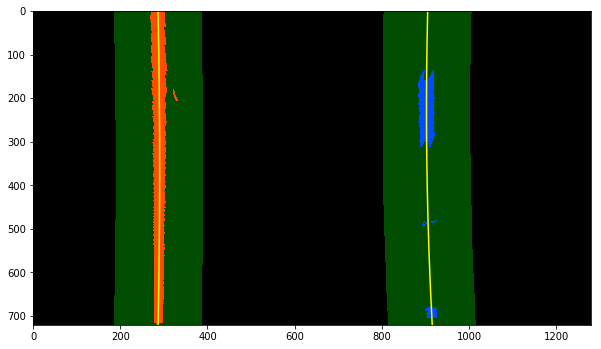

In [15]:
# 5.3: Skip the sliding windows step once you know where the lines are ---------------------------------------------------------------
"""
Now you know where the lines are you have a fit! 
In the next frame of video you don't need to do a blind search again, 
but instead you can just search in a margin around the previous line position like this:
"""
margin = 100 # ***********************************

nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])

left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy +
left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) +
left_fit[1]*nonzeroy + left_fit[2] + margin)))

right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy +
right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) +
right_fit[1]*nonzeroy + right_fit[2] + margin)))

# Again, extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds]
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]
# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx  = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]


# And you're done! But let's visualize the result here as well
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin,
                              ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin,
                              ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)


ind_plot = 1
if (ind_plot):

    plt.figure(figsize=(10,8))
    plt.imshow(result)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.show()


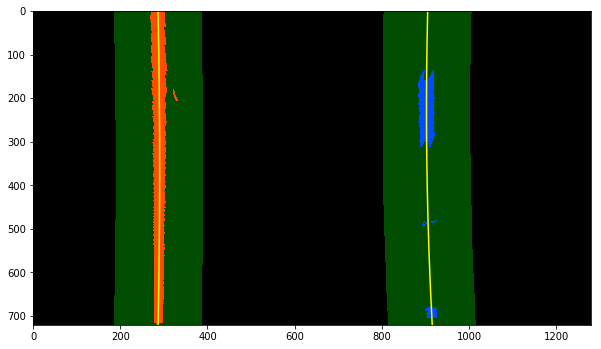

In [16]:
def lane_line_process(binary_warped, margin=100):

    binary_warped;

    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0] // 2:, :], axis=0)

    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped)) * 255
    window_img = np.zeros_like(out_img)

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0] / 2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9  # ****************************************************************************************

    # Set height of windows
    window_height = np.int(binary_warped.shape[0] / nwindows)

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero  = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window + 1) * window_height
        win_y_high = binary_warped.shape[0] - window * window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img, (win_xleft_low, win_y_low), (win_xleft_high, win_y_high),
                      (0, 255, 0), 2)
        cv2.rectangle(out_img, (win_xright_low, win_y_low), (win_xright_high, win_y_high),
                      (0, 255, 0), 2)
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                          (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                           (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty      = np.linspace(0, binary_warped.shape[0] - 1, binary_warped.shape[0])
    left_fitx  = left_fit[0] * ploty ** 2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty ** 2 + right_fit[1] * ploty + right_fit[2]


    out_img = np.dstack((binary_warped, binary_warped, binary_warped)) * 255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx - margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx + margin,
                                                                    ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx - margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx + margin,
                                                                     ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0, 255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0, 255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

    class output_struct:
        result     = None
        left_fitx  = None
        right_fitx = None
        ploty      = None

    output = output_struct()
    output.out_img    = out_img
    output.result     = result
    output.left_fitx  = left_fitx
    output.right_fitx = right_fitx
    output.ploty      = ploty
    output.lefty      = lefty
    output.leftx      = leftx
    output.righty     = righty
    output.rightx     = rightx

    return output



output = lane_line_process(binary_warped, margin=100)

ind_plot = 1
if (ind_plot):
    # plt.figure()
    # plt.imshow(out_img)
    # plt.plot(left_fitx, ploty, color='yellow')
    # plt.plot(right_fitx, ploty, color='yellow')
    # plt.xlim(0, 1280)
    # plt.ylim(720, 0)
    # plt.show()

    plt.figure(figsize=(10,8))
    plt.imshow(output.result)
    plt.plot(output.left_fitx, ploty, color='yellow')
    plt.plot(output.right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.show()

# Step 6: Calculate Radius of Curvature

In [17]:
def cal_radius_offset(output):
    
    left_fitx  = output.left_fitx
    right_fitx = output.right_fitx
    
    ploty  = output.ploty
    lefty  = output.lefty
    leftx  = output.leftx
    righty = output.righty
    rightx = output.rightx
    
    
    y_eval = np.max(ploty)

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr  = np.polyfit(lefty*ym_per_pix,  leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)

    # Calculate the new radii of curvature
    left_curve_m  = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix  + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curve_m = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    average_curve_m = (left_curve_m + right_curve_m)/2

    # Offset
    # You can assume the camera is mounted at the center of the car, 
    # such that the lane center is the midpoint at the bottom of the image 
    # between the two lines you've detected. 
    # The offset of the lane center from the center of the image 
    # (converted from pixels to meters) is your distance 
    # from the center of the lane.
    mid_point = (left_fitx[719] + right_fitx[719])/2
    offset = abs(img_size[0]/2 - mid_point) * xm_per_pix 
    
    class output_radius_offset_struct:
        left_curve_m    = None
        right_curve_m   = None
        average_curve_m = None
        offset          = None

    output_radius_offset_struct.left_curve_m    = left_curve_m
    output_radius_offset_struct.right_curve_m   = right_curve_m
    output_radius_offset_struct.average_curve_m = average_curve_m
    output_radius_offset_struct.offset          = offset

    return output_radius_offset_struct

output_radius_offset = cal_radius_offset(output)
left_curve_m    = output_radius_offset.left_curve_m
right_curve_m   = output_radius_offset.right_curve_m
average_curve_m = output_radius_offset.average_curve_m
offset          = output_radius_offset.offset

print('Left Curve = %.4f m\nRight Curve = %.4f m\nCenter Average Curve = %.4f m\nOffset = %.4f [m]' % (left_curve_m, right_curve_m, average_curve_m, offset))

Left Curve = 5784.9921 m
Right Curve = 3044.3766 m
Center Average Curve = 4414.6844 m
Offset = 0.2053 [m]


# Step 7: Paint the Lane Area

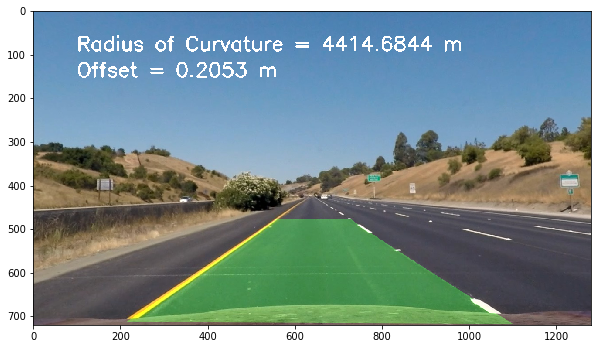

In [18]:
# Create an image to draw the lines on
binary_warped = warped_img;
warp_zero = np.zeros_like(warped_img).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

text_curvature = 'Radius of Curvature = %.4f m' % average_curve_m
text_offset    = 'Offset = %.4f m' % offset

# Warp the blank back to original image space using inverse perspective matrix (Minv)
newwarp = cv2.warpPerspective(color_warp, Minv, (image_shape[1], image_shape[0])) 

# Combine the result with the original image
result = cv2.addWeighted(img_RGB_undist, 1, newwarp, 0.3, 0)

text_curvature = 'Radius of Curvature = %.4f m' % average_curve_m
text_offset    = 'Offset = %.4f m' % offset
cv2.putText(result, text_curvature, (100,90), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=3 )
cv2.putText(result, text_offset, (100,150),   cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=3 )

plt.figure(figsize=(10,8))
plt.imshow(result)
plt.show()

# Step 8: Putting All Together

In [19]:
# Putting All Together
def lane_detection_pipeline(img_BGR0):

    # 1: Convert to BGR --> RGB --------------------------------------------------------
    #img_RGB = cv2.cvtColor(img_BGR, cv2.COLOR_BGR2RGB)
    img_BGR0;
    img_RGB0 = cv2.cvtColor(img_BGR0, cv2.COLOR_BGR2RGB)

    # 2: Distortion Correction --------------------------------------------------------
    #img_RGB_undist = cv2.undistort(img_RGB, mtx, dist, None, mtx)  # ***************
    img_BGR_undist = cv2.undistort(img_BGR0, mtx, dist, None, mtx)  # ***************
    img_RGB_undist = cv2.undistort(img_RGB0, mtx, dist, None, mtx)

    # 3: Color and Gradient -----------------------------------------------------------
    img_col_grad = process_color_and_gradient(img_BGR_undist, ksize=3)

    # 4: Warped Image -----------------------------------------------------------------
    warped_img, M, Minv = warp(img_col_grad)

    # 5: Lane line --------------------------------------------------------------------
    output_lane_line = lane_line_process(warped_img, margin=100)
    result_output_lane_line = output_lane_line.result
    left_fitx  = output_lane_line.left_fitx
    right_fitx = output_lane_line.right_fitx
    ploty      = output_lane_line.ploty

    # 6: Radius of Curvatur and Offset ------------------------------------------------
    output_radius_offset = cal_radius_offset(output_lane_line)
    average_curve_m = output_radius_offset.average_curve_m
    offset          = output_radius_offset.offset

    # 7: Paint the Lane Area ----------------------------------------------------------
    binary_warped = warped_img;
    warp_zero = np.zeros_like(warped_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))

    newwarp = cv2.warpPerspective(color_warp, Minv, (image_shape[1], image_shape[0]))

    result  = cv2.addWeighted(img_RGB_undist, 1, newwarp, 0.3, 0)
    #result2 = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
    
    text_curvature = 'Radius of Curvature = %.4f m' % average_curve_m
    text_offset    = 'Offset = %.4f m' % offset
    cv2.putText(result, text_curvature, (100,90), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=3 )
    cv2.putText(result, text_offset, (100,150),   cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=3 )



    return result #result_output_lane_line  #result

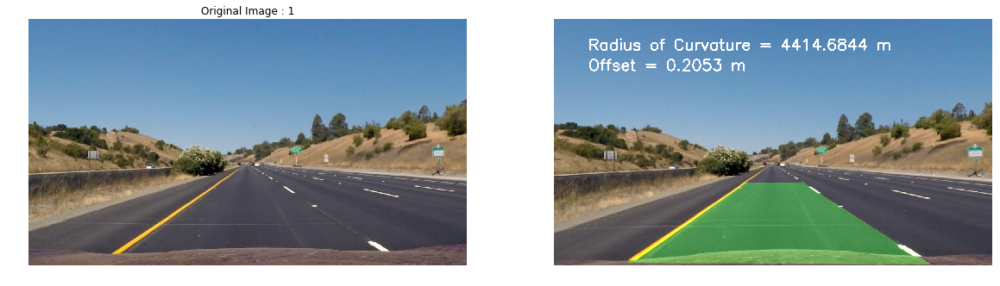

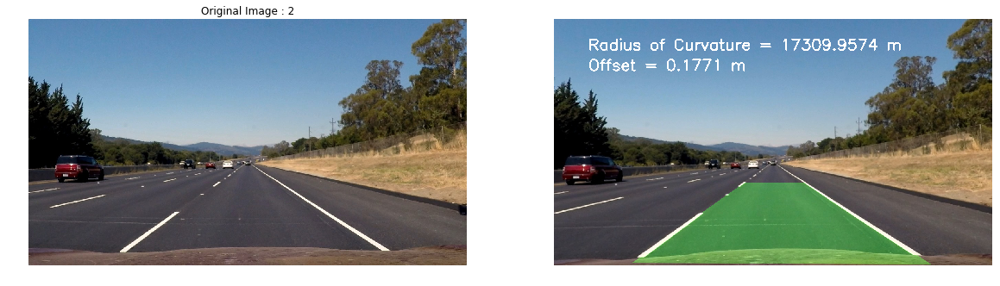

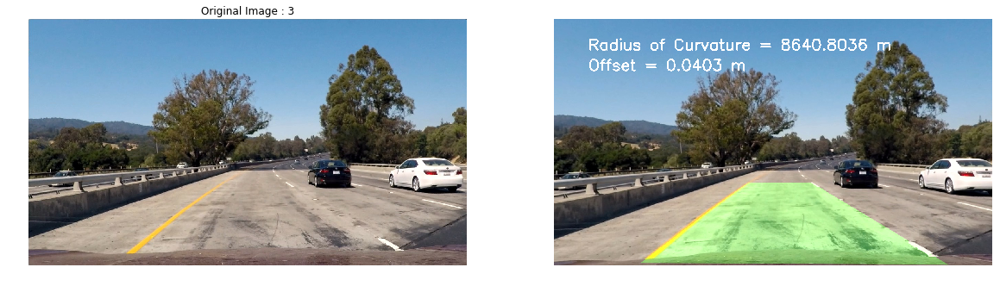

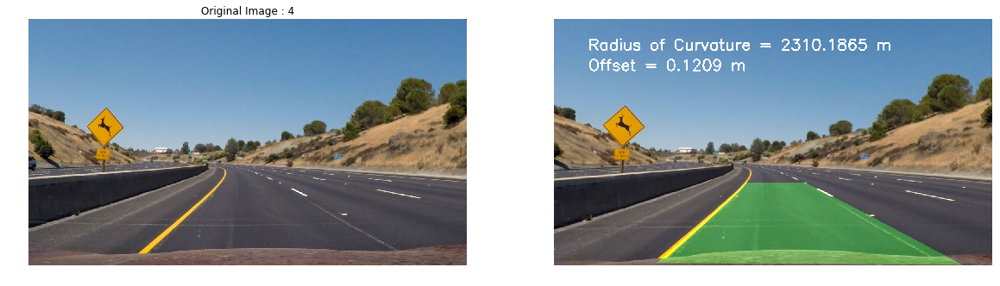

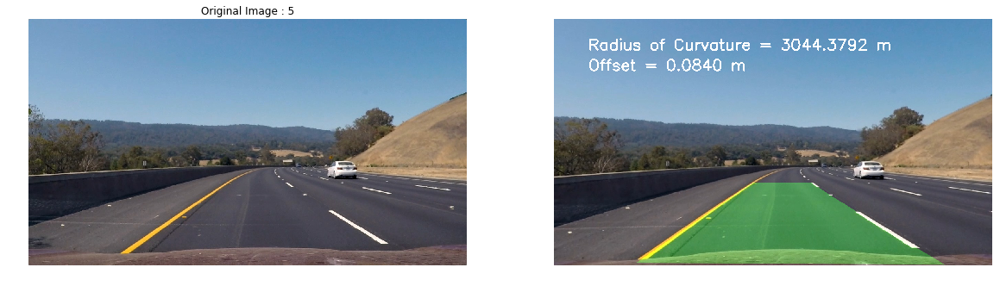

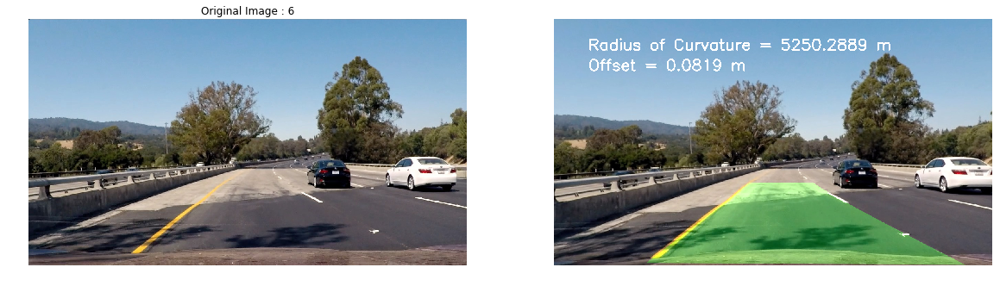

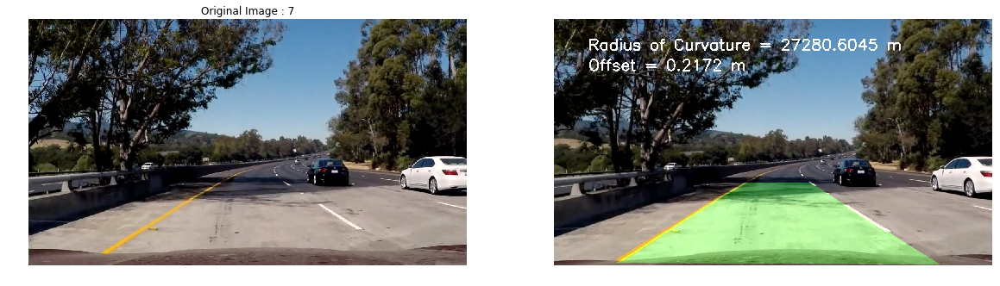

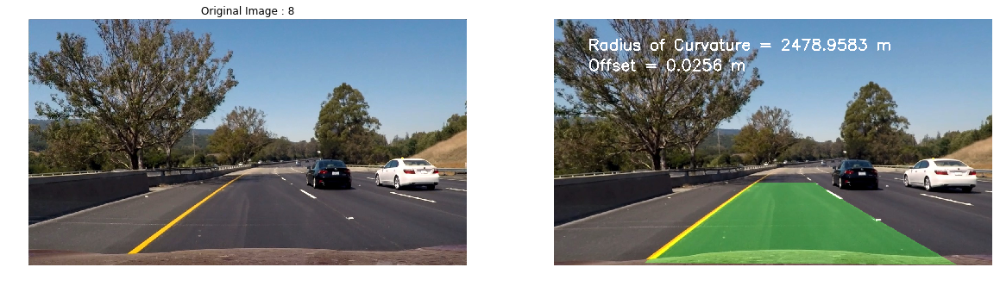

In [20]:
ind_plot = 1
images_test = glob.glob('test_images/*.jpg')
for ii, fname in enumerate(images_test):

    img_BGR0 = cv2.imread(fname)
    img_RGB0 = cv2.cvtColor(img_BGR0, cv2.COLOR_BGR2RGB)

    img_out0 = lane_detection_pipeline(img_BGR0)

    if (ind_plot == 1): #(idx == 0):
        
        fig, axes = plt.subplots(1, 2, figsize=(20, 10)) # , figsize=(20, 10)

        axes[0].imshow(img_RGB0)
        axes[0].set_title('Original Image : {}'.format(ii+1)); axes[0].set_axis_off()
        axes[1].imshow(img_out0); axes[1].set_axis_off()
plt.show()



# Step 9: Create Video

In [21]:
# Putting All Together
def lane_detection_pipeline2(img_BGR0):

    # 1: Convert to BGR --> RGB --------------------------------------------------------
    #img_RGB = cv2.cvtColor(img_BGR, cv2.COLOR_BGR2RGB)
    img_BGR0;
    img_RGB0 = cv2.cvtColor(img_BGR0, cv2.COLOR_BGR2RGB)

    # 2: Distortion Correction --------------------------------------------------------
    #img_RGB_undist = cv2.undistort(img_RGB, mtx, dist, None, mtx)  # ***************
    img_BGR_undist = cv2.undistort(img_BGR0, mtx, dist, None, mtx)  # ***************
    img_RGB_undist = cv2.undistort(img_RGB0, mtx, dist, None, mtx)

    # 3: Color and Gradient -----------------------------------------------------------
    img_col_grad = process_color_and_gradient(img_BGR_undist, ksize=3)

    # 4: Warped Image -----------------------------------------------------------------
    warped_img, M, Minv = warp(img_col_grad)

    # 5: Lane line --------------------------------------------------------------------
    output_lane_line = lane_line_process(warped_img, margin=100)
    result_output_lane_line = output_lane_line.result
    left_fitx  = output_lane_line.left_fitx
    right_fitx = output_lane_line.right_fitx
    ploty      = output_lane_line.ploty

    # 6: Radius of Curvatur and Offset ------------------------------------------------
    output_radius_offset = cal_radius_offset(output_lane_line)
    average_curve_m = output_radius_offset.average_curve_m
    offset          = output_radius_offset.offset

    # 7: Paint the Lane Area ----------------------------------------------------------
    binary_warped = warped_img;
    warp_zero = np.zeros_like(warped_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))

    newwarp = cv2.warpPerspective(color_warp, Minv, (image_shape[1], image_shape[0]))

    result  = cv2.addWeighted(img_RGB_undist, 1, newwarp, 0.3, 0)
    result2 = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
    
    text_curvature = 'Radius of Curvature = %.4f m' % average_curve_m
    text_offset    = 'Offset = %.4f m' % offset
    cv2.putText(result2, text_curvature, (100,90), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=3 )
    cv2.putText(result2, text_offset, (100,150),   cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=3 )



    return result2 #result_output_lane_line  #result

In [22]:
from moviepy.editor import VideoFileClip

video_output = 'project_video_output.mp4';
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4");
video_output_clip = clip1.fl_image(lane_detection_pipeline2); #NOTE: this function expects color images!!
%time video_output_clip.write_videofile(video_output, audio=False);

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [04:59<00:00,  4.30it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 5min 18s, sys: 1min 23s, total: 6min 41s
Wall time: 5min


In [23]:
print("Project Completed :)")

Project Completed :)
